In [4]:
%matplotlib inline
import pandas as pd
import numpy as np
import tensorflow as tf
from google.colab import files
import seaborn as sns
from sklearn.model_selection import train_test_split
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from sklearn import metrics
uploaded = files.upload()
uploaded = files.upload()

Saving Labels.csv to Labels.csv


Saving images.npy to images.npy


Pre-Processing Image Data

In [5]:
import numpy as np
Data = pd.read_csv("Labels.csv")
Data.shape

(4750, 1)

In [6]:
img_array = np.load("images.npy", allow_pickle=True)

In [7]:
img_array.shape

(4750, 128, 128, 3)

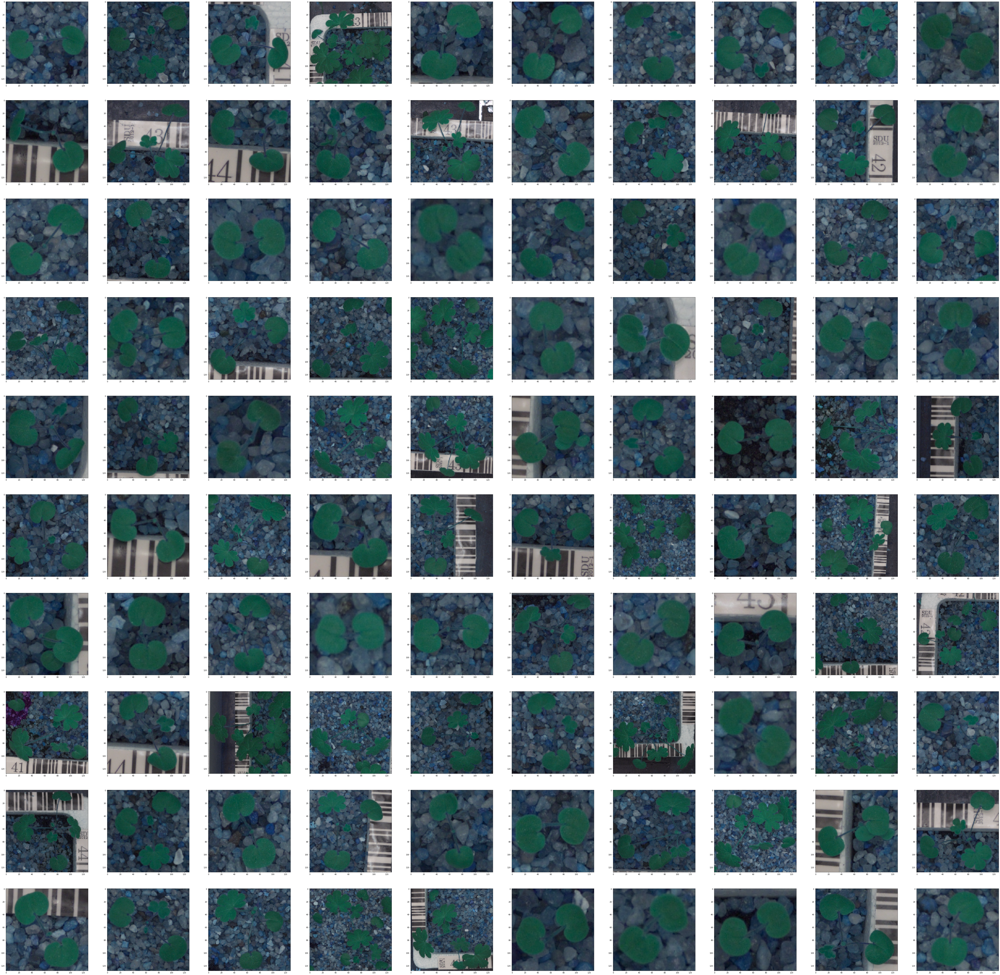

In [8]:
from matplotlib import pyplot as plt
fig, axes = plt.subplots(10, 10, figsize=(100,100))
for i, ax in enumerate(axes.flat):
  ax.imshow(img_array[i])

Visualizing of Images

In [9]:
X_data = np.array(img_array[:,:,0,0])

In [10]:
X_data.shape

(4750, 128)

In [11]:
y_data = Data.iloc[:,-1]

In [12]:
y_data.shape

(4750,)

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size = 0.2, random_state = 7)

In [14]:
from sklearn import preprocessing
X_train = preprocessing.normalize(X_train)

In [15]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(3800, 128)
(950, 128)
(3800,)
(950,)


In [16]:
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

X_train /= 255
X_test /= 255

In [17]:
print("X_train shape:", X_train.shape)
print("Images in X_train:", X_train.shape[0])
print("Images in X_test:", X_test.shape[0])
print("Max value in X_train:", X_train.max())
print("Min value in X_train:", X_train.min())

X_train shape: (3800, 128)
Images in X_train: 3800
Images in X_test: 950
Max value in X_train: 0.0014285049
Min value in X_train: 0.0


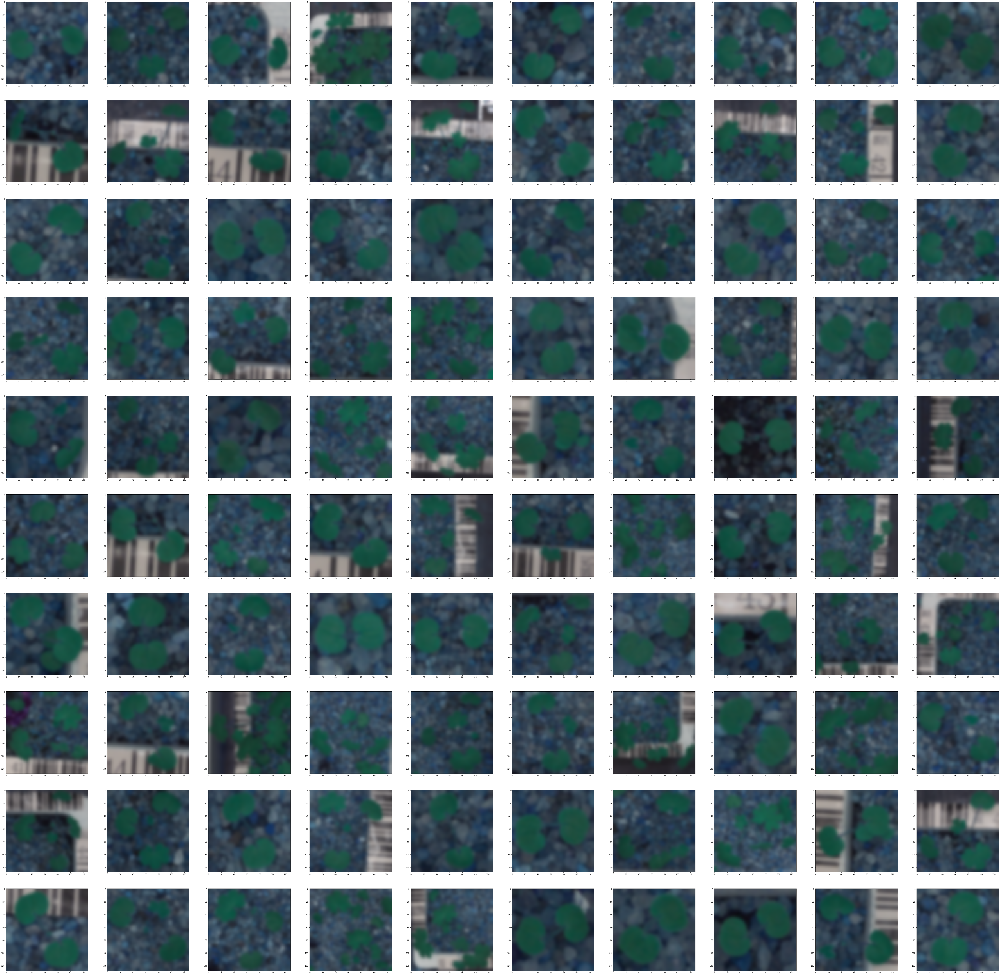

In [23]:
import cv2
from matplotlib import pyplot as plt
img_array = np.load("images.npy", allow_pickle=True)
fig, axes = plt.subplots(10, 10, figsize=(100,100))
for i, ax in enumerate(axes.flat):
  gaussian = cv2.GaussianBlur(img_array[i], (15, 15), 0)
  ax.imshow(gaussian)